# Init

In [1]:
from pprint import pprint
from copy import deepcopy
import numpy as np
import matplotlib.pyplot as plt
import h5py
import os
import itertools
from importlib import reload
from IPython.display import clear_output
import pycqed.analysis.measurement_analysis as ma
import pycqed.analysis.analysis_toolbox as a_tools
import pycqed.analysis_v2.timedomain_analysis as tda
import pycqed.analysis_v2.readout_analysis as ra
from pycqed.analysis_v2 import base_analysis as ba
import pycqed.analysis_v2.tomography_qudev as tomo
from pycqed.measurement.pulse_sequences.multi_qubit_tek_seq_elts import get_tomography_pulses
reload(a_tools)
a_tools.datadir = "Q:\\USERS\\nathan\\data\\thesis_data"
figsave_base = "C:\\Users\\nathan\\projects\\master_thesis\\chapters\\carb_gate\\figs\\"


c:\users\nathan\code\quantumsoftware\pycqed_py3\data
Data directory set to: c:\users\nathan\code\quantumsoftware\pycqed_py3\data
c:\users\nathan\code\quantumsoftware\pycqed_py3\data
Data directory set to: c:\users\nathan\code\quantumsoftware\pycqed_py3\data


In [2]:
import qutip as qtp
import numpy as np
import collections
odict = collections.OrderedDict

In [59]:
# define plotting style

font_size       = 18
marker_size     = 6
line_width      = 2.5
axes_line_width = 1
tick_length     = 5
tick_width      = 1
tick_color      = 'k'
ticks_direction = 'in'
axes_labelcolor = 'k'

fig_size_dim    = 8
golden_ratio    = (1+np.sqrt(5))/2
fig_size        = (fig_size_dim, fig_size_dim/golden_ratio)
dpi             =  300

params = {'figure.figsize': fig_size,
          'figure.dpi': dpi,
          'savefig.dpi': dpi,
          'font.size': font_size,
          'font.family': "DIN Pro",#"cmss10", #"DINPro", # to manage to use dinpro, put ttf files in site-packages/matplotlib/mpl-data/fonts
          'mathtext.default': 'it',
          'mathtext.fontset': "cm",
          'mathtext.it': 'cm',
          'figure.titlesize': font_size,
          'legend.fontsize': font_size,
          'axes.labelsize': font_size,
          'axes.labelcolor': axes_labelcolor,
          'axes.titlesize': font_size,
          'axes.linewidth': axes_line_width,
          'lines.markersize': marker_size,
          'lines.linewidth': line_width,
          'xtick.direction': ticks_direction,
          'ytick.direction': ticks_direction,
          'xtick.labelsize': font_size,
          'ytick.labelsize': font_size,
          'xtick.color': tick_color,
          'ytick.color': tick_color,
          'xtick.major.size': tick_length,
          'ytick.major.size': tick_length,
          'xtick.major.width': tick_width,
          'ytick.major.width': tick_width,
          'xtick.top': True,
          'xtick.bottom': True,
          'ytick.left': True,
          'ytick.right': True,
          'axes.formatter.useoffset': False,
            'pdf.fonttype' : 42, 
            'ps.fonttype' : 42,
          
          # LEGEND
        'legend.loc'           : 'best',
        'legend.frameon'       : False,     ## if True, draw the legend on a background patch
#         'legend.framealpha'    : 0.8,      ## legend patch transparency
#         'legend.facecolor'     : 'inherit',  ## inherit from axes.facecolor; or color spec
#         'legend.edgecolor'     : 0.8,      ## background patch boundary color
#         'legend.fancybox'      : True,     ## if True, use a rounded box for the
                                         ## legend background, else a rectangle
            }

plt.rcParams.update(params)

In [4]:
def standard_qubit_pulses_to_rotations(pulse_list):
    """
    Converts lists of n-tuples of standard PycQED single-qubit pulse names to
    the corresponding rotation matrices on the n-qubit Hilbert space.
    """
    standard_pulses = {
        'I': qtp.qeye(2),
        'X180': qtp.sigmax(),
        'mX180': qtp.rotation(qtp.sigmax(), -np.pi),
        'Y180': qtp.sigmay(),
        'mY180': qtp.rotation(qtp.sigmay(), -np.pi),
        'X90': qtp.rotation(qtp.sigmax(), np.pi/2),
        'mX90': qtp.rotation(qtp.sigmax(), -np.pi/2),
        'Y90': qtp.rotation(qtp.sigmay(), np.pi/2),
        'mY90': qtp.rotation(qtp.sigmay(), -np.pi/2),
        'Z90': qtp.rotation(qtp.sigmaz(), np.pi/2),
        'mZ90': qtp.rotation(qtp.sigmaz(), -np.pi/2),
        'Z180': qtp.sigmaz(),
        'mZ180': qtp.rotation(qtp.sigmaz(), -np.pi),
    }
    rotations = [qtp.tensor(*[standard_pulses[pulse] for pulse in qb_pulses])
                 for qb_pulses in pulse_list]
    for i in range(len(rotations)):
        rotations[i].dims = [[d] for d in rotations[i].shape]
    return rotations

In [5]:
data_dict_all = {}

## plot density matrix function

In [6]:
import matplotlib as mpl
def default_phase_cmap(add_alpha=False, alpha=1, cols=None, scale_factor=1):
    if cols is None:
        cols = [(0, (0.89, 0.02, 0.02, 1)),
                (0.45, (0.91, 0.5, 0.5, 0.85)),
                (0.465, (0.95, 0.82, 0.81, 0.75)),
                (0.485, (0.95, 0.89, 0.81, 0.5)),
                (0.5, (0.95, 0.95, 0.81, 0.175)), #
                (0.515, (0.9, 0.9, 0.95, 0.5)),
                (0.535, (0.7, 0.8, 0.9, 0.75)),
                (0.55, (0.42, 0.62, 0.72, 0.85)),
                (1, (0.35, 0.56, 0.71, 1))]
    return mpl.colors.LinearSegmentedColormap.from_list('mycmap', cols)

from mpl_toolkits.mplot3d import Axes3D
import datetime
def plot_density_matrices(rho_exp, rho_target=None, rho_sim=None, nr_qubits=2,
                          real_part=True, save_fig=False, show=True, fig_title=None, format="pdf"):
#     line_width=1
#     axes_line_width=1        
#     marker_size=6
#     font_size=16
#     params = {
#           'figure.dpi': 300,
#           'savefig.dpi': 300,
#           'figure.titlesize': font_size,
#           'legend.fontsize': font_size,
#           'axes.labelsize': font_size,
#           'axes.titlesize': font_size,
#           'axes.linewidth': axes_line_width,
#           'xtick.labelsize': font_size,
#           'ytick.labelsize': font_size,
#           'lines.markersize': marker_size,
#           'lines.linewidth': line_width,
#           'xtick.direction': 'in',
#           'ytick.direction': 'in',
#           }
#     plt.rcParams.update(params)
#     fig = plt.figure()
    fig = plt.figure(figsize=(16, 8))
    ax = Axes3D(fig, azim=-25, elev=55, proj_type='ortho')
#     ax = Axes3D(fig, azim=-35, elev=45)
    ax.patch.set_facecolor('white')
    ax.w_xaxis.set_pane_color((1, 1, 1, 1.0))
    ax.w_yaxis.set_pane_color((1, 1, 1, 1.0))
    ax.w_zaxis.set_pane_color((1, 1, 1, 1.0))


    if real_part:
        data_reconstr = np.real(rho_exp).flatten()
        if rho_target is not None:
            data_tar = np.real(rho_target).flatten()
        if rho_sim is not None:
            data_sim = np.real(rho_sim).flatten()
    else:
        data_reconstr = np.imag(rho_exp).flatten()
        if rho_target is not None:
            data_tar = np.imag(rho_target).flatten()
        if rho_sim is not None:
            data_sim = np.imag(rho_sim).flatten()
    
    pauli_ops_labels = [''.join(s) for s in list(
        itertools.product(['I', 'X', 'Y', 'Z'], repeat=nr_qubits))]
  
    xpos, ypos = np.meshgrid(np.arange(len(pauli_ops_labels)), 
                             np.arange(len(pauli_ops_labels)))
    xpos = xpos.flatten()
    ypos = ypos.flatten()
    cmap = default_phase_cmap()#add_alpha=True, alpha=0.75, scale_factor=50)
    color0 = [cmap((a+0.25)/(0.5)) for a in data_reconstr]
    color = len(xpos)*[(0,0,0,0)] + color0
    
    linewidth = len(xpos)*[1.5] + len(xpos)*[1] 
    edgecolor = len(xpos)*[(0,0,0,1)] + len(xpos)*[(0,0,0,1)]
    
    dx1 = 0.75
    dx2 = 0.75
    dx = np.concatenate((dx1*np.ones_like(xpos), dx2*np.ones_like(xpos)))
    dz = np.concatenate((data_tar, data_reconstr))
    
    xpos = np.concatenate((xpos, xpos)) - dx/2
    ypos = np.concatenate((ypos, ypos)) - dx/2
    zpos = np.zeros_like(xpos)
    ax.bar3d(xpos, ypos, zpos, dx, dx, dz, color=color, 
             linewidth=linewidth, edgecolor=edgecolor)
    
    # labels   
    ax.set_xticks(np.arange(len(pauli_ops_labels)))
    ax.set_yticks(np.arange(len(pauli_ops_labels)))
    ax.set_xticklabels(pauli_ops_labels, 
                       rotation=0, horizontalalignment='right')
    ax.set_yticklabels(pauli_ops_labels,
                       rotation=0, horizontalalignment='left')
    
    ax.set_zlim(-0.25, 0.5)
#     ax.set_zticks([-0.2, -0.1, 0, 0.1, 0.2, 0.3;])
    ax.set_zlabel(r'$Re(\chi)$' if real_part else r'$Im(\chi)$')
#     fig.tight_layout()

    # Hack fixing the labels
    fig.add_axes([0,0,1,1]).axis("off")

    if save_fig:
        if fig_title is None:
            fig_title='CZ_chi_matrix_{}'.format('real' if real_part else 'imag')
        fig_title = '{}--{:%Y%m%d_%H%M%S}'.format(fig_title, datetime.datetime.now())
        filename = os.path.abspath(os.path.join(os.getcwd(), fig_title+'.' + format))
        fig.savefig(filename, bbox_inches='tight', dpi=600)
    if show:
        plt.show()
    return fig, ax

# QB2QB1 - I, X90, Y90, X180

## Extract data

In [7]:

# tstart = "20191209_154945"
# tend = "20191209_162251"
# second round pi
# tstart = "20191209_163230"
# tend = "20191209_170538"
# pi/2
# tstart = "20191209_171036"
# tend = "20191209_174342"
# 45, 90 ... 315
# tstart = "20191209_190734"
# tend = "20191209_230850"
# 45, 90 ... 315
tstart = "20191210_012446"
tend = "20191210_052821"
qubits = ['qb2', 'qb3']
angles = np.linspace(0,np.pi/2, 8, endpoint=False)[1:] # cphase angles
fidelity = {}
n_cal_states = len(qubits)**2
tomography_options = dict(mle=True, basis_rots=('I', 'X90', 'Y90'))
n_segments = len(get_tomography_pulses(*qubits, basis_pulses=tomography_options['basis_rots'])) \
    + n_cal_states
ts_list = a_tools.get_timestamps_in_range(tstart,
                                         tend,
                                          label='tomography')
ts_list

['20191210_012818',
 '20191210_013028',
 '20191210_013238',
 '20191210_013448',
 '20191210_013658',
 '20191210_013908',
 '20191210_014117',
 '20191210_014327',
 '20191210_014537',
 '20191210_014746',
 '20191210_014957',
 '20191210_015208',
 '20191210_015418',
 '20191210_015628',
 '20191210_015838',
 '20191210_020047',
 '20191210_020257',
 '20191210_020506',
 '20191210_020716',
 '20191210_020925',
 '20191210_021135',
 '20191210_021345',
 '20191210_021555',
 '20191210_021805',
 '20191210_022015',
 '20191210_022225',
 '20191210_022435',
 '20191210_022645',
 '20191210_022855',
 '20191210_023104',
 '20191210_023314',
 '20191210_023524',
 '20191210_023733',
 '20191210_023943',
 '20191210_024152',
 '20191210_024401',
 '20191210_024612',
 '20191210_024821',
 '20191210_025031',
 '20191210_025241',
 '20191210_025451',
 '20191210_025701',
 '20191210_025910',
 '20191210_030120',
 '20191210_030329',
 '20191210_030540',
 '20191210_030749',
 '20191210_030959',
 '20191210_031209',
 '20191210_031419',


In [8]:
U1s = {pulse: standard_qubit_pulses_to_rotations([(pulse,)])[0] for pulse in ['X90', 'Y90', 'mX90', 'mY90', 'I', 
                                                                                   'X180', 'Y180', 'mY180', 'mX180']}
UCphi = dict()
for angle in angles:
    UCphi[angle] = qtp.Qobj(np.diag([1, 1, 1, np.exp(1j*angle)]))
    UCphi[angle].dims = [[2, 2], [2, 2]]

qbcn = 'qb3'
qbtn = 'qb2'

C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import Qu

In [9]:
rots_basis = ('I', 'X90', 'Y90', 'X180')
gate_of_interest = 'CZ ' + qbtn + ' ' + qbcn
prep_pulses_list = list(itertools.product(rots_basis, repeat=len(qubits)))

In [10]:
data_dict = dict()
for j, angle in enumerate(angles):
    data_dict[angle] = odict([(''.join(prep_pulses_list[i]), 
                               {'ts': ts_list[len(prep_pulses_list)*j + i]}) for i in range(len(prep_pulses_list))])


In [14]:
reload(tda)

<module 'pycqed.analysis_v2.timedomain_analysis' from 'c:\\users\\nathan\\code\\quantumsoftware\\pycqed_py3\\pycqed\\analysis_v2\\timedomain_analysis.py'>

In [15]:
reload(tomo)
reload(tda)
rerun_analysis = False
for angle in angles:
    for prep_pulses in prep_pulses_list:
        prep_pulses_key = ''.join(prep_pulses)
        # rho computed
        if not rerun_analysis:
            try:
                a = ma.MeasurementAnalysis(auto=False, timestamp=data_dict[angle][prep_pulses_key]['ts'])
                data_dict[angle][prep_pulses_key]['rho'] = \
                    qtp.Qobj(np.array(a.data_file["Analysis"]["Processed data"]['rho_array']), 
                            dims=[[2**len(qubits)], [2**len(qubits)]])
            except KeyError: # rho not found
                try:
                    print(data_dict[angle][prep_pulses_key]['ts'])
                    a = ma.MeasurementAnalysis(auto=False, timestamp=data_dict[angle][prep_pulses_key]['ts'])
                    qubit_states = np.array(a.data_file["Analysis"]["Processed data"]['qubit_states']).T
                    # filter leakage
                    filter = np.all(qubit_states != 2, axis=0)
                    options = dict(
                        n_readouts=n_segments,  # number of segments
                        data_type="singleshot",
                        # give thresholded shots
                        shots_thresholded={qbn: np.array(qubit_states[i])
                                           for i, qbn in enumerate(qubits)},
                        shot_filter=filter,  # filter specific shots out
                        qb_names=qubits, # to construct channel map automatically
                        basis_rots_str=
                            tomography_options.get("basis_rots",
                                                   tomo.DEFAULT_BASIS_ROTS),
                        # filter cal points from data
                        data_filter=lambda prob_table: prob_table[:-n_cal_states],
                        mle=tomography_options.get("mle", True))
                    if not tomography_options.get("cal_points_correction", True):
                        # ideal measurement operators
                        meas_operators = []
                        for i in range(2**len(qubits)):
                            basis_state = np.zeros(2**len(qubits))
                            basis_state[i] = 1
                            meas_operators.append(np.diag(basis_state))
                        # overwrite if provided by user
                        meas_operators = tomography_options.get("meas_operators",
                                                               meas_operators)
                        options.update(dict(meas_operators=meas_operators))
                    sta = tda.StateTomographyAnalysis(t_start=data_dict[angle][prep_pulses_key]['ts'], options_dict=options)
                    sta.proc_data_dict['rho_array'] = sta.proc_data_dict['rho'].full()
                    sta.save_processed_data('rho_array')
                    data_dict[angle][prep_pulses_key]['rho'] = sta.proc_data_dict['rho']
                except Exception as e:
                    raise e
                    data_dict[angle][prep_pulses_key]['rho'] = np.nan
                
        if rerun_analysis:
            print(prep_pulses_key, data_dict[angle][prep_pulses_key]['ts'])
            try:
                a = ma.MeasurementAnalysis(auto=False, timestamp=data_dict[angle][prep_pulses_key]['ts'])
                qubit_states = np.array(a.data_file["Analysis"]["Processed data"]['qubit_states']).T
                # filter leakage
                filter = np.all(qubit_states != 2, axis=0)
                options = dict(
                    n_readouts=n_segments,  # number of segments
                    data_type="singleshot",
                    # give thresholded shots
                    shots_thresholded={qbn: np.array(qubit_states[i])
                                       for i, qbn in enumerate(qubits)},
                    shot_filter=filter,  # filter specific shots out
                    qb_names=qubits, # to construct channel map automatically
                    basis_rots_str=
                        tomography_options.get("basis_rots",
                                               tomo.DEFAULT_BASIS_ROTS),
                    # filter cal points from data
                    data_filter=lambda prob_table: prob_table[:-n_cal_states],
                    mle=tomography_options.get("mle", True))
                if not tomography_options.get("cal_points_correction", True):
                    # ideal measurement operators
                    meas_operators = []
                    for i in range(2**len(qubits)):
                        basis_state = np.zeros(2**len(qubits))
                        basis_state[i] = 1
                        meas_operators.append(np.diag(basis_state))
                    # overwrite if provided by user
                    meas_operators = tomography_options.get("meas_operators",
                                                           meas_operators)
                    options.update(dict(meas_operators=meas_operators))
                sta = tda.StateTomographyAnalysis(t_start=data_dict[angle][prep_pulses_key]['ts'], options_dict=options)

                data_dict[angle][prep_pulses_key]['rho'] = sta.proc_data_dict['rho']
                sta.proc_data_dict['rho_array'] = sta.proc_data_dict['rho'].full()
                sta.save_processed_data('rho_array')
                
            except Exception as e:
                raise e
                data_dict[angle][prep_pulses_key]['rho'] = np.nan
        

20191210_052821
['UHF_pg w23 UHF', 'UHF_pe w23 UHF', 'UHF_pf w23 UHF', 'UHF_pg w45 UHF', 'UHF_pe w45 UHF', 'UHF_pf w45 UHF']
Q:\USERS\nathan\data\thesis_data\20191210\052821_cphi_process_tomography_1.3744467859455345_('X180', 'X180')
['UHF_w2', 'UHF_w3', 'UHF_w2', 'UHF_w3', 'UHF_w2', 'UHF_w3', 'UHF_w2', 'UHF_w3', 'UHF_w2', 'UHF_w3', 'UHF_w2', 'UHF_w3']
{'qb2': ['UHF_pg w23 UHF', 'UHF_pe w23 UHF', 'UHF_pf w23 UHF']}
['UHF_w4', 'UHF_w5', 'UHF_w4', 'UHF_w5', 'UHF_w4', 'UHF_w5', 'UHF_w4', 'UHF_w5', 'UHF_w4', 'UHF_w5', 'UHF_w4', 'UHF_w5']
{'qb2': ['UHF_pg w23 UHF', 'UHF_pe w23 UHF', 'UHF_pf w23 UHF'], 'qb3': ['UHF_pg w45 UHF', 'UHF_pe w45 UHF', 'UHF_pf w45 UHF']}


In [17]:
sta.data_file.close()

In [18]:
for a, d in data_dict.items():
    print(a)
    for k, v in d.items():
        if not isinstance(v['rho'],qtp.Qobj) :
#             print(v['rho'])
            print(v['ts'], v['rho'])

0.19634954084936207
0.39269908169872414
0.5890486225480862
0.7853981633974483
0.9817477042468103
1.1780972450961724
1.3744467859455345


## Get lambda_array

In [19]:
measured_rhos = {}
for angle in angles:
    measured_rhos[angle] = []
    for i, op_name in enumerate(data_dict[angle]):
        print(op_name)
        measured_rhos[angle] += [data_dict[angle][op_name]['rho'].full().flatten()]
    measured_rhos[angle] = np.asarray(measured_rhos[angle])

II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180
II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180
II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180
II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180
II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180
II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180
II
IX90
IY90
IX180
X90I
X90X90
X90Y90
X90X180
Y90I
Y90X90
Y90Y90
Y90X180
X180I
X180X90
X180Y90
X180X180


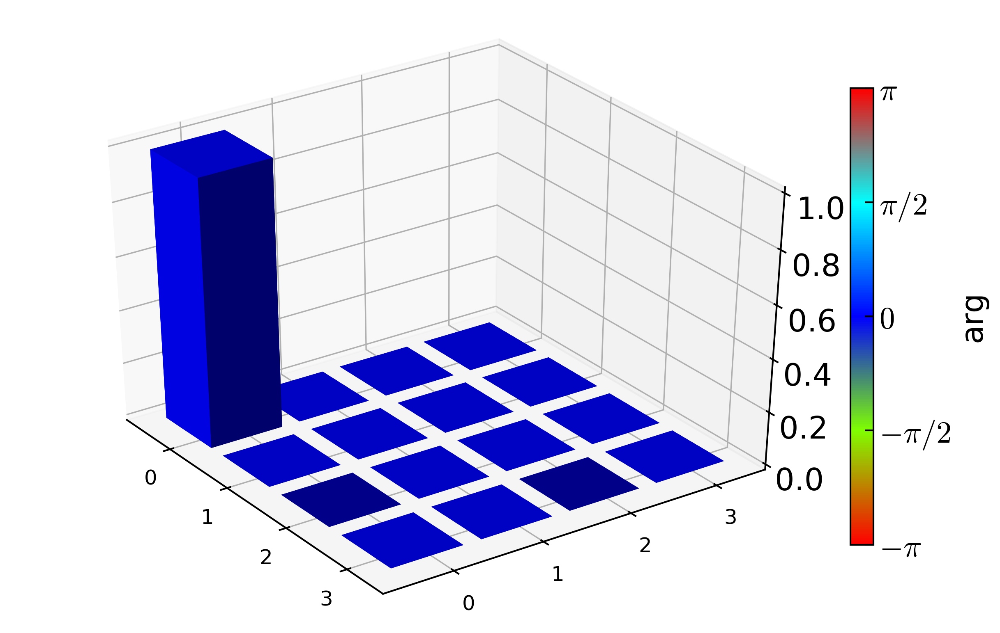

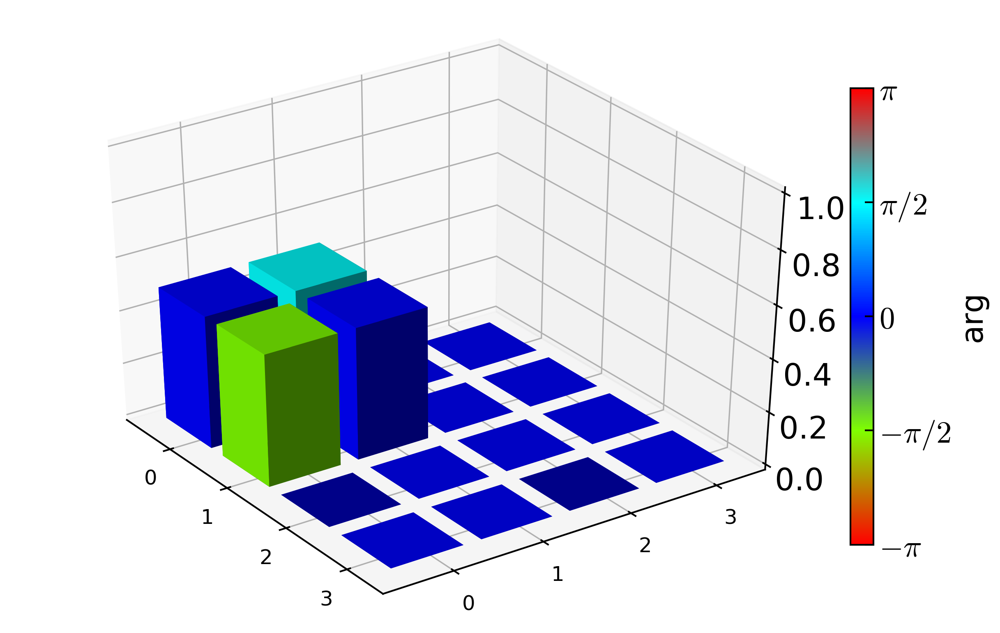

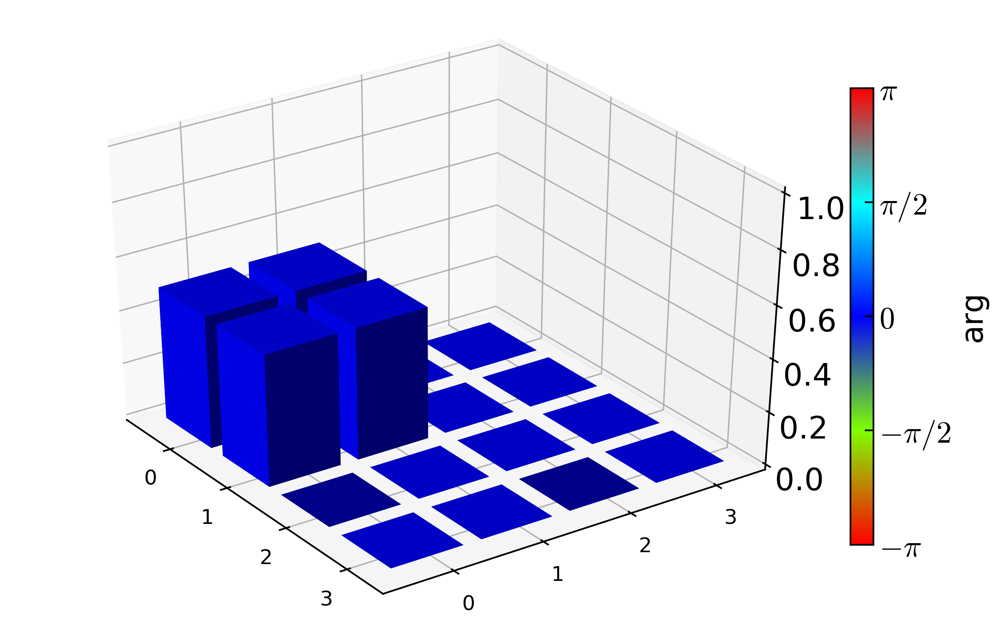

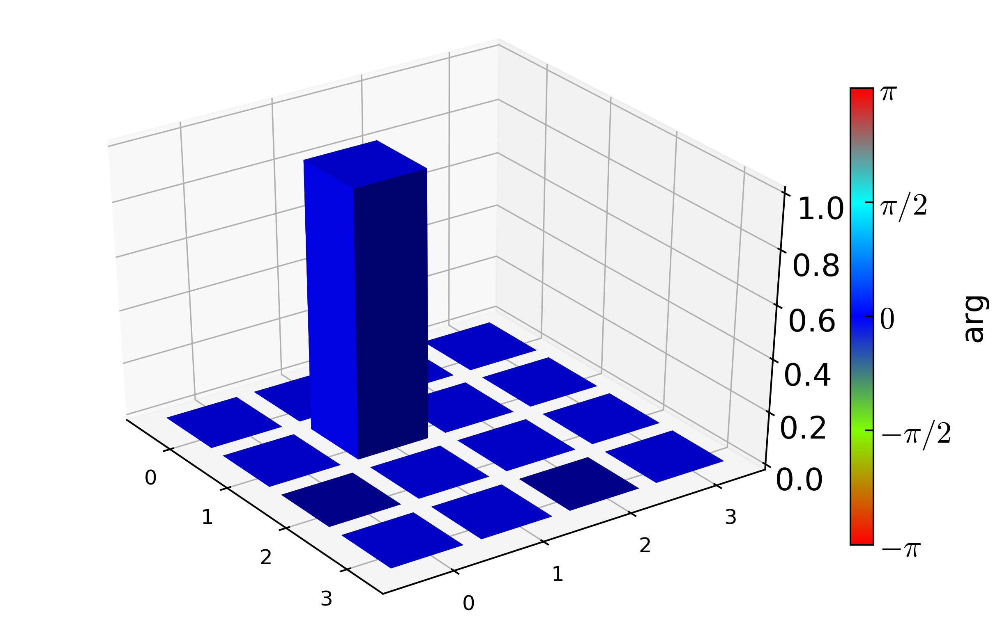

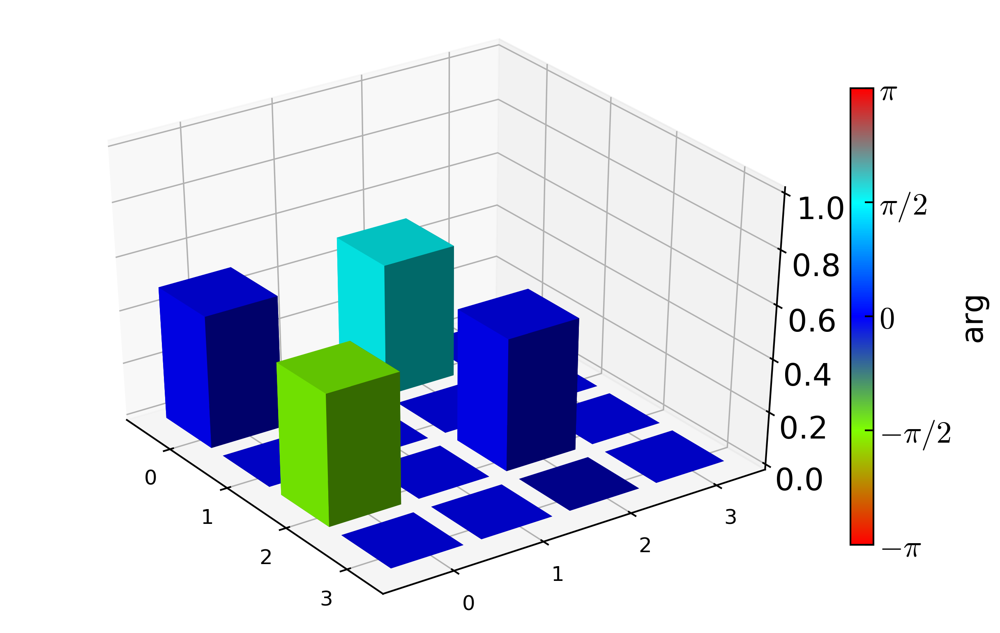

...

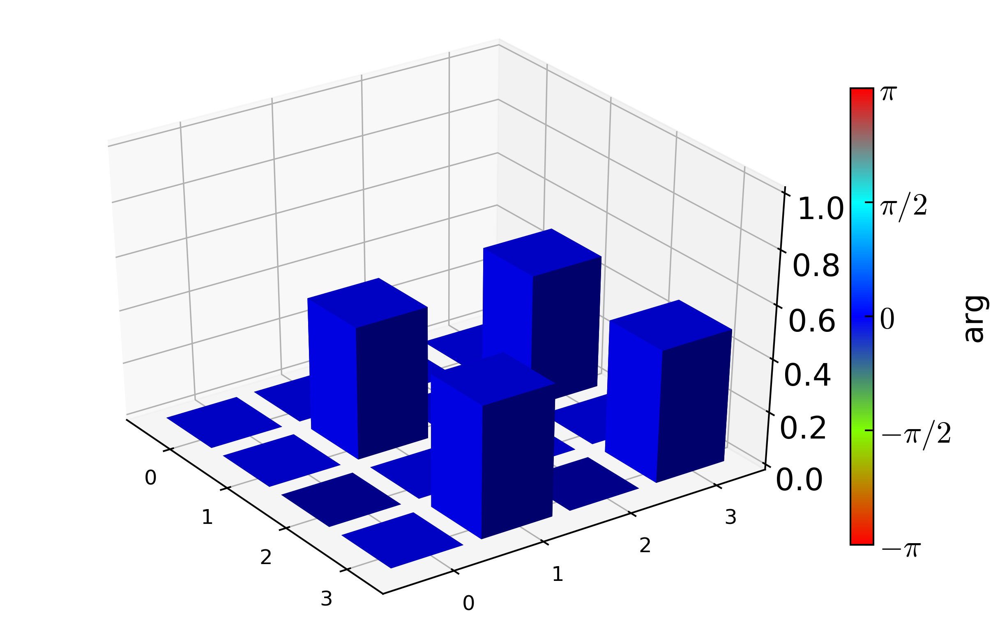

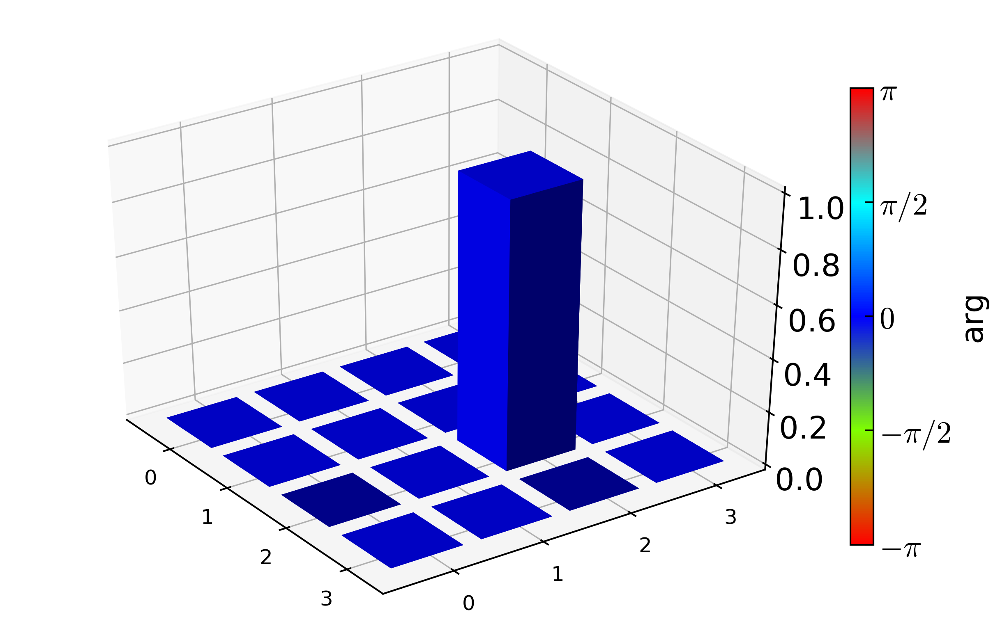

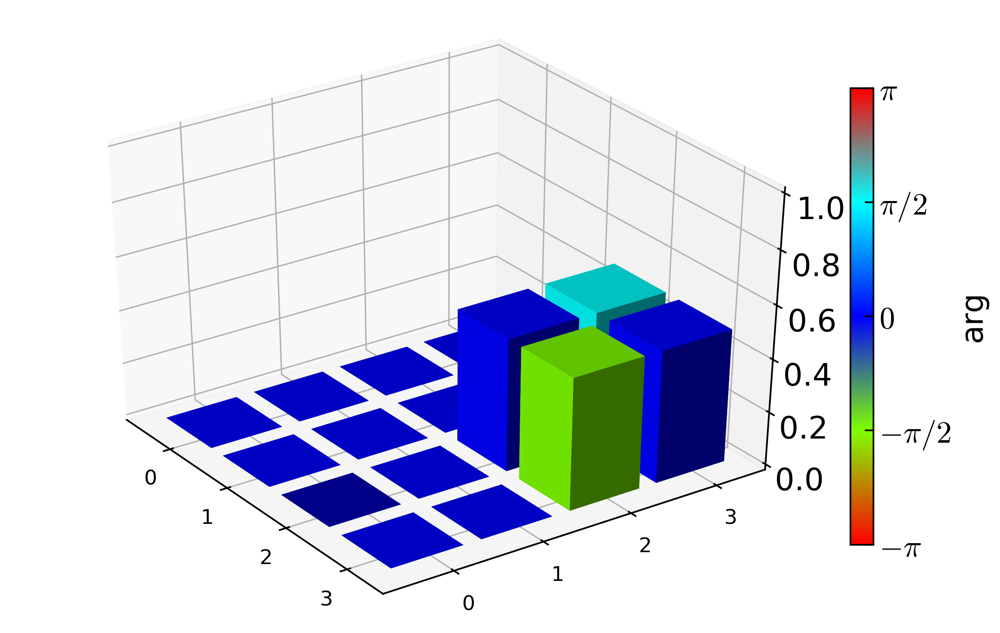

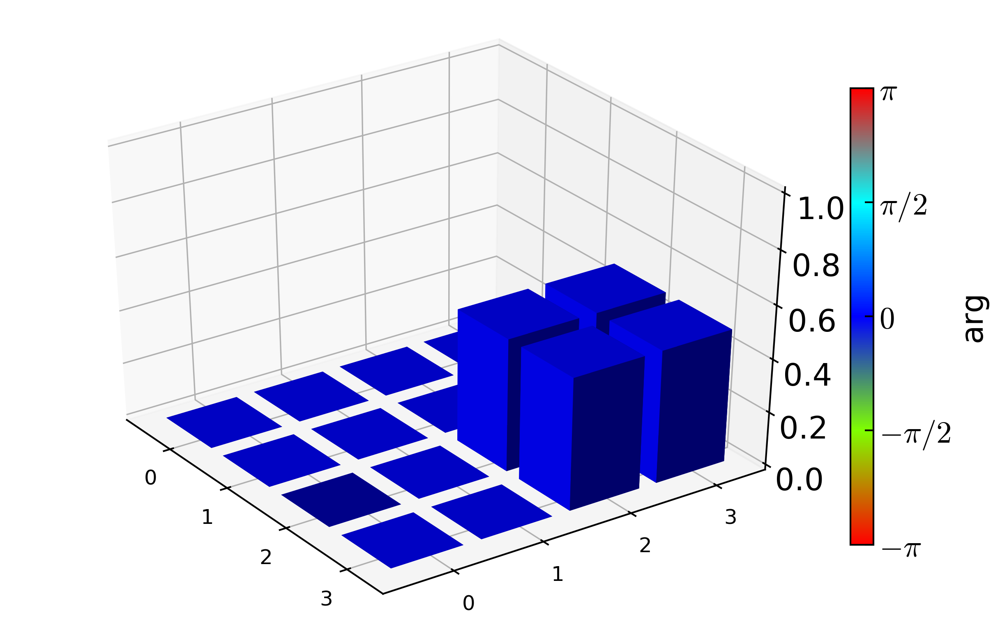

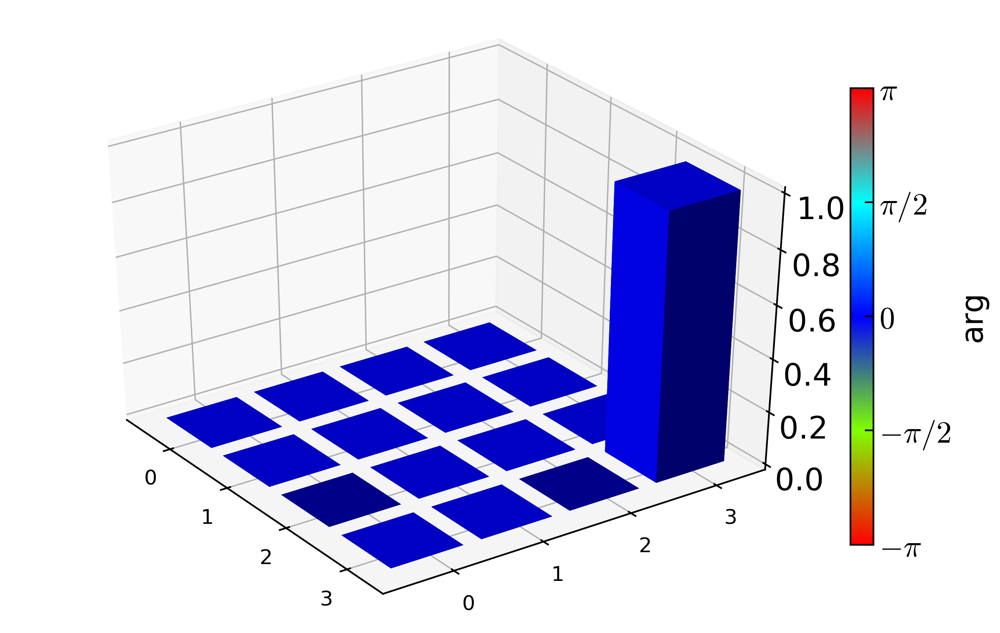

In [28]:
preped_rhos = []
preped_rhos_flatten = []
for i, prep_pulses in enumerate(prep_pulses_list):
    prep_pulses_key = ''.join(prep_pulses)
    print(prep_pulses_key, data_dict[angle][prep_pulses_key]['ts'])
    print(U1s[prep_pulses[0]], U1s[prep_pulses[1]])
    psi_target = (qtp.tensor(U1s[prep_pulses[0]], U1s[prep_pulses[1]]) * 
                  qtp.tensor(qtp.basis(2), qtp.basis(2)))#.full() 
    rho_target = psi_target*psi_target.dag()
    qtp.matrix_histogram_complex(rho_target)
    preped_rhos += [rho_target]
    preped_rhos_flatten += [rho_target.full().flatten()]
preped_rhos = np.asarray(preped_rhos, dtype=object)
preped_rhos_flatten = np.asarray(preped_rhos_flatten)
clear_output()

In [29]:
lambda_arrays = {}
for angle in angles:
    lambda_arrays[angle] = np.dot(measured_rhos[angle], np.linalg.inv(preped_rhos_flatten))

## Get beta_array

In [30]:
standard_2qb_pauli_labels = list(itertools.product(['I', 'X180', 'Y180', 'Z180'], repeat=2))
len(standard_2qb_pauli_labels)

16

In [31]:
standard_2qb_pauli_labels

[('I', 'I'),
 ('I', 'X180'),
 ('I', 'Y180'),
 ('I', 'Z180'),
 ('X180', 'I'),
 ('X180', 'X180'),
 ('X180', 'Y180'),
 ('X180', 'Z180'),
 ('Y180', 'I'),
 ('Y180', 'X180'),
 ('Y180', 'Y180'),
 ('Y180', 'Z180'),
 ('Z180', 'I'),
 ('Z180', 'X180'),
 ('Z180', 'Y180'),
 ('Z180', 'Z180')]

In [32]:
standard_2qb_pauli_ops = standard_qubit_pulses_to_rotations(standard_2qb_pauli_labels)
len(standard_2qb_pauli_ops)
# standard_2qb_pauli_ops

C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import Qu

16

In [33]:
prepared_rhos_rotated = []
cnt = 0
for i, prepared_rho in enumerate(preped_rhos):
    for plhs in standard_2qb_pauli_ops:
        plhs.dims = [[2,2], [2,2]]
        for prhs in standard_2qb_pauli_ops:
            prhs.dims = [[2,2], [2,2]]
            cnt += 1
            prepared_rhos_rotated += [(plhs*prepared_rho*prhs.dag()).full().flatten()]
prepared_rhos_rotated = np.asarray(prepared_rhos_rotated)

In [34]:
beta_array = np.dot(prepared_rhos_rotated, np.linalg.inv(preped_rhos_flatten))

## Get chi matrix

In [35]:
chunck_size = len(standard_2qb_pauli_ops)**2
beta_array_reshaped = np.zeros(shape=(len(preped_rhos)**2, chunck_size), dtype='complex128')
for i in range(len(preped_rhos)):
    beta_array_reshaped[i*len(preped_rhos): (i+1)*len(preped_rhos), :] = \
        beta_array[i*chunck_size:(i+1)*chunck_size, :].T
    print(beta_array[i*chunck_size:(i+1)*chunck_size, :].T.shape)

(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)
(16, 256)


In [36]:
beta_array_reshaped.shape

(256, 256)

In [37]:
# chi = np.dot(np.linalg.pinv(beta_array_reshaped), lambda_array.flatten())
chis = {}
for angle in angles:
    chis[angle]  = np.linalg.solve(beta_array_reshaped, lambda_arrays[angle].flatten())
    chis[angle] = chis[angle].reshape((16, 16))
#     chis[angle][0:16]

In [38]:
chis_qtp = {}
for angle in angles:
    chis_qtp[angle] = qtp.Qobj(chis[angle], dims = [[[2, 2], [2, 2]], [[2, 2], [2, 2]]])
    chis_qtp

0.19634954084936207
0.39269908169872414
0.5890486225480862
0.7853981633974483
0.9817477042468103
1.1780972450961724
1.3744467859455345


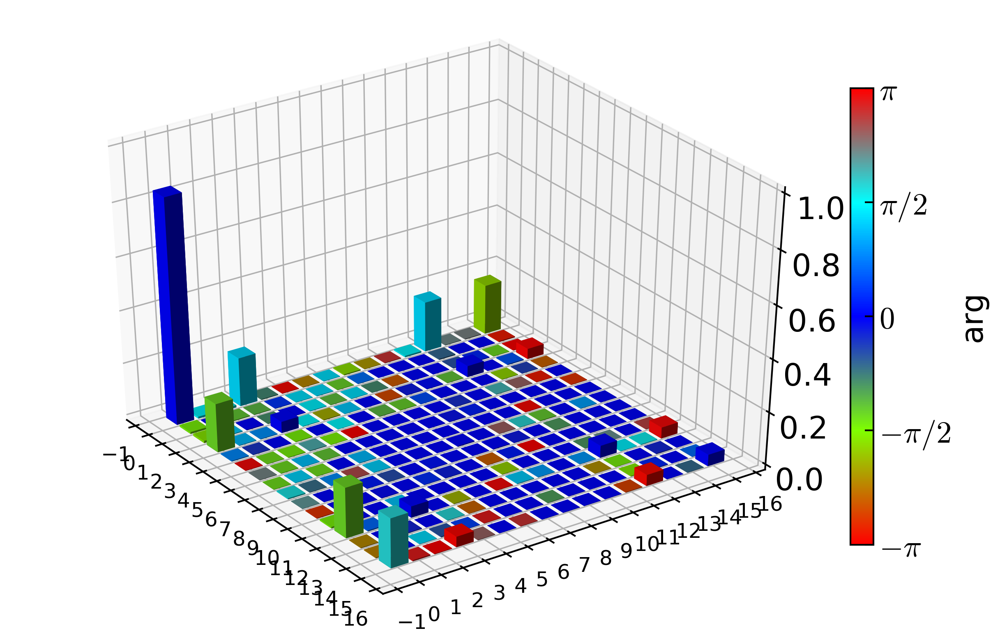

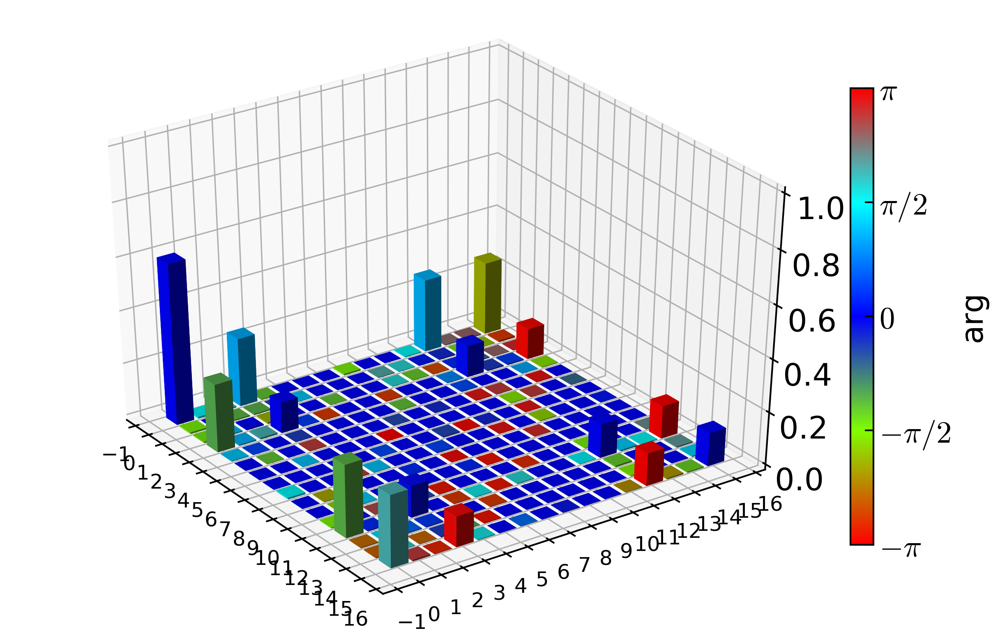

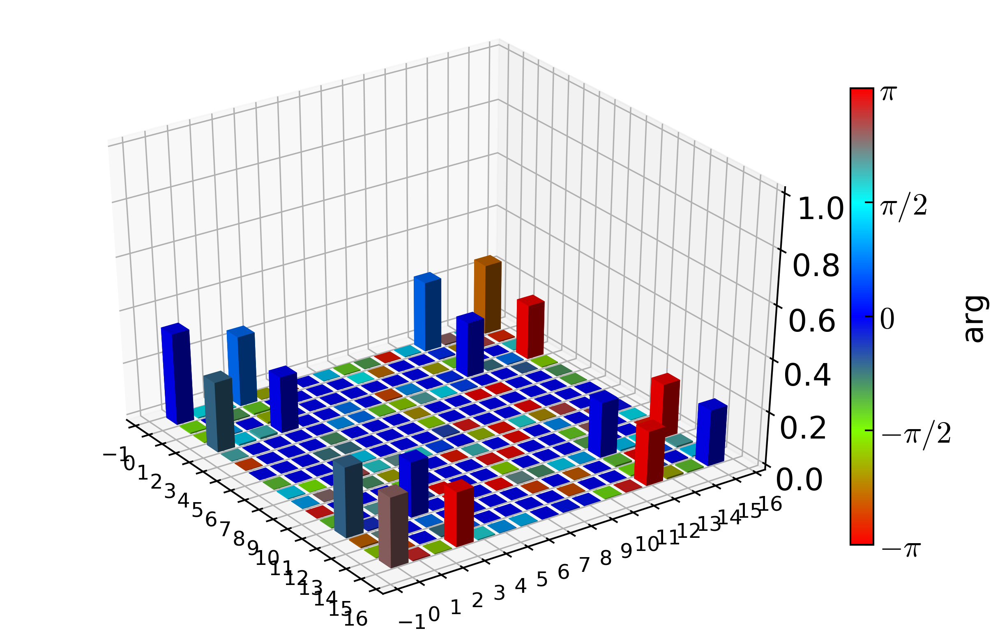

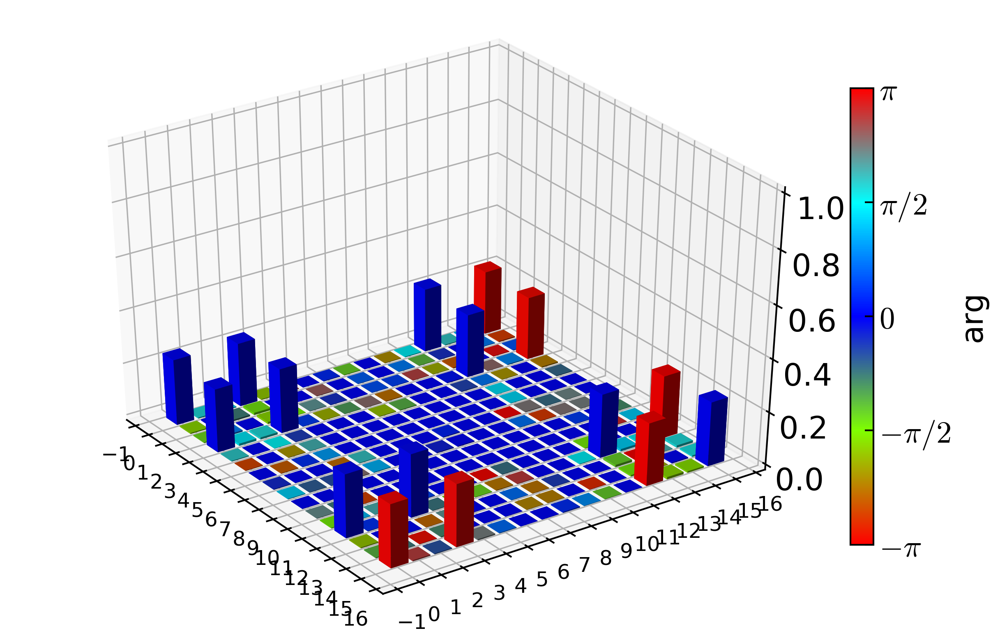

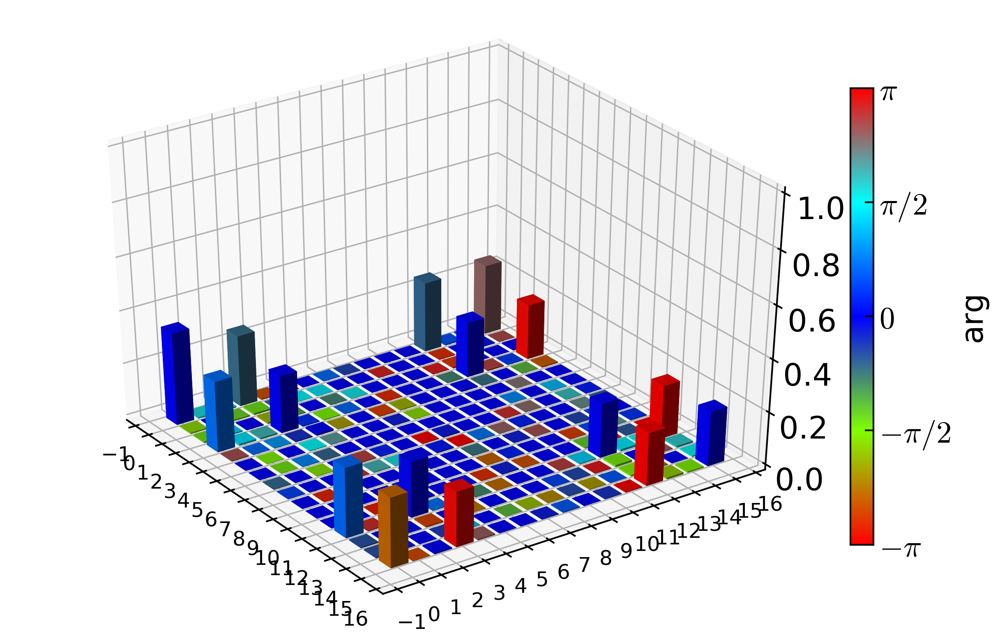

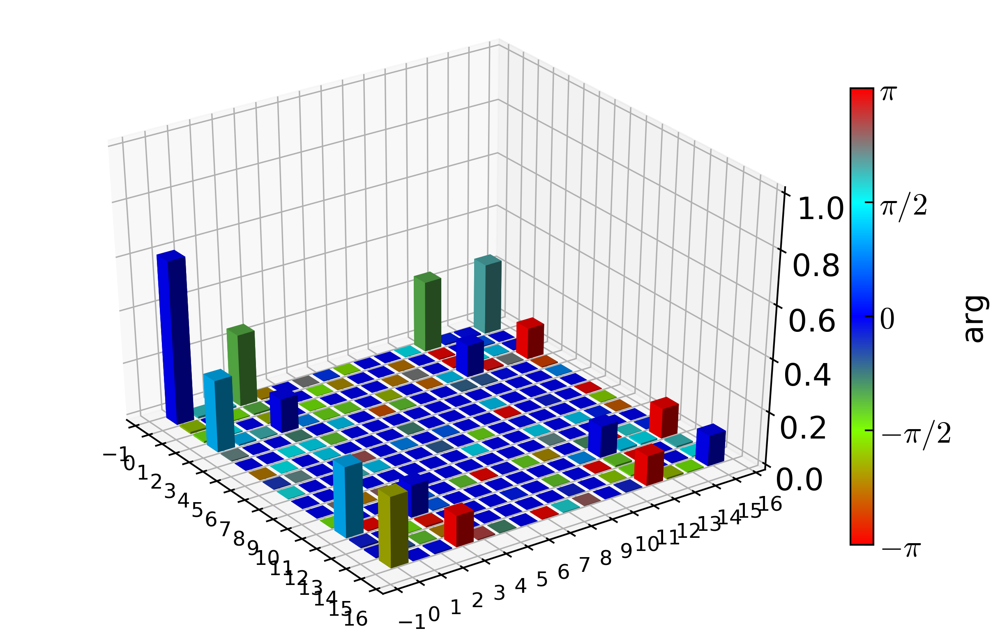

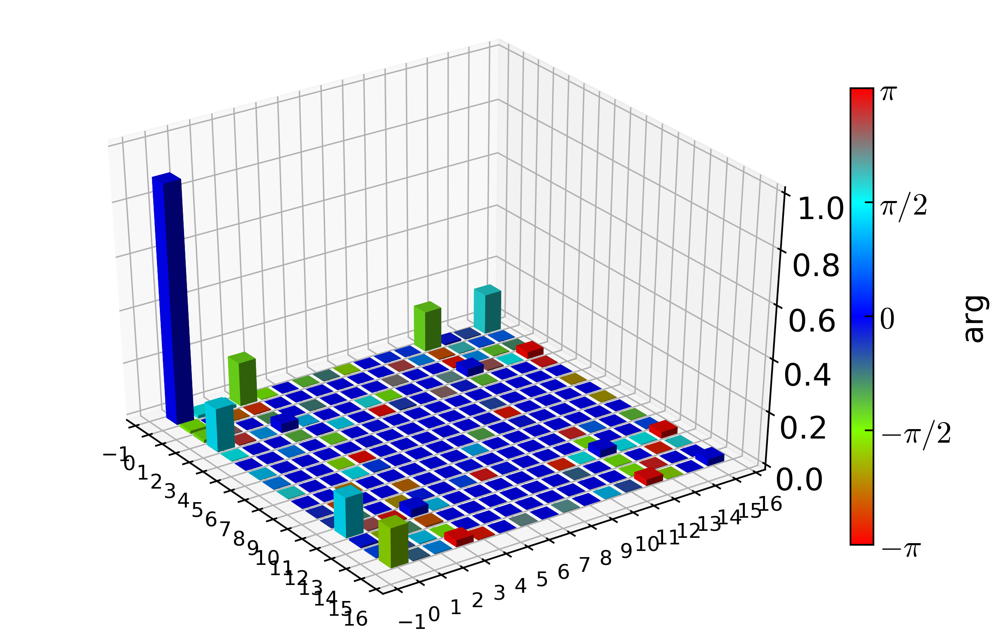

In [39]:
for angle in angles:
    print(angle)
    qtp.matrix_histogram_complex(chis_qtp[angle])
    data_dict[angle]['chi_CZ'] = chis_qtp[angle]
    key = ''.join(qubits)+''.join(rots_basis)
    data_dict_all[key] = data_dict

## Fidelity

In [40]:
UCZ_ideal = dict()
plot = False
for angle in angles:
    UCZ_ideal[angle] = qtp.to_chi(qtp.cphase(4*angle))/16
    if plot:
        qtp.matrix_histogram_complex(UCZ_ideal[angle])

C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import Qubi

In [135]:
for angle in angles:
    fidelity[angle] = 100*qtp.process_fidelity(chis_qtp[angle], UCZ_ideal[angle])
print(fidelity)

{0.19634954084936207: (97.98193540451301+5.811321569376012e-15j), 0.39269908169872414: (97.55612424711204-4.813855788617414e-15j), 0.5890486225480862: (97.46817109999864-1.1622642114301278e-14j), 0.7853981633974483: (97.16419533077902-3.165868711654086e-14j), 0.9817477042468103: (97.55089982883003-5.594482067847958e-14j), 1.1780972450961724: (97.886179043042-9.6927634875946e-15j), 1.3744467859455345: (98.30007506662645+5.640559432654664e-15j)}


In [200]:
from pprint import pprint
import pandas as pd
for angle in angles:
    fidelity[angle] = np.real(100*qtp.process_fidelity(chis_qtp[angle], UCZ_ideal[angle]))

df = pd.DataFrame([np.array(list(fidelity.keys()))*4*180/np.pi, fidelity.values()],  ).transpose()
df.columns = ["Angle (deg.)", "Process Fidelity (%)"]
df

,Angle (deg.),Process Fidelity (%)
0,45.0,98.013644
1,90.0,97.700835
2,135.0,97.448186
3,180.0,97.312726
4,225.0,97.507021
5,270.0,97.841784
6,315.0,98.348675


In [38]:
1-np.real((chi_qtp*UCZ_ideal).tr()/(chi_qtp.tr()*UCZ_ideal.tr()))

0.009573987438738163

# Second round Tomography

In [241]:
from pprint import pprint
import pandas as pd
for angle in angles:
    fidelity[angle] = np.real(100*qtp.process_fidelity(chis_qtp[angle], UCZ_ideal[angle]))

df = pd.DataFrame([np.array(list(fidelity.keys()))*4*180/np.pi, fidelity.values()],  ).transpose()
df.columns = ["Angle (deg.)", "Process Fidelity (%)"]
df

c:\users\nathan\masterthesis\code\env\lib\site-packages\qutip\qobj.py:521: UserWarning:

Multiplying superoperators with different representations



,Angle (deg.),Process Fidelity (%)
0,45.0,97.981934
1,90.0,97.556124
2,135.0,97.469172
3,180.0,97.164195
4,225.0,97.550900
5,270.0,97.886179
6,315.0,98.300348


# Summary

In [45]:
angles*180/np.pi*4

array([ 45.,  90., 135., 180., 225., 270., 315.])

In [48]:
save_fig = False
angle_selection = [3, 6]

In [52]:
plt.rcParams['lines.linewidth'] = 0.5

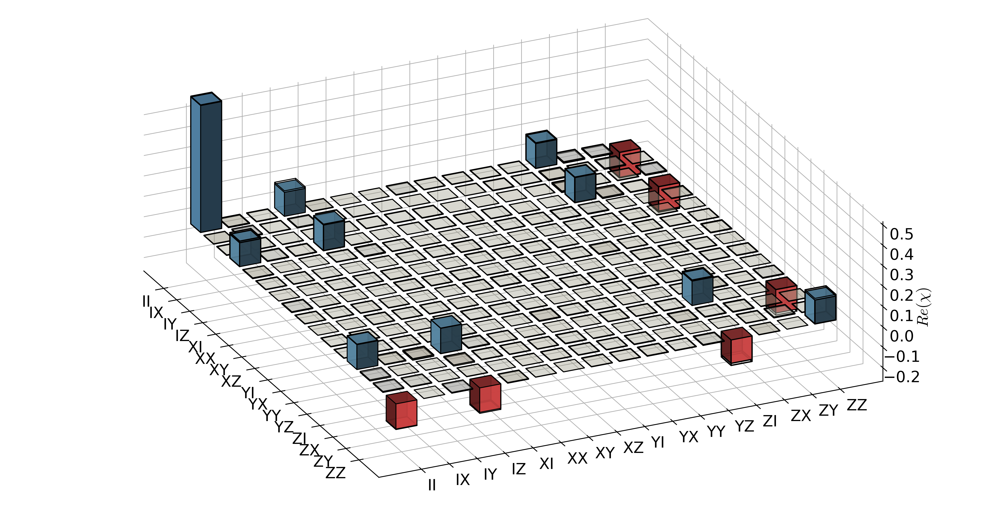

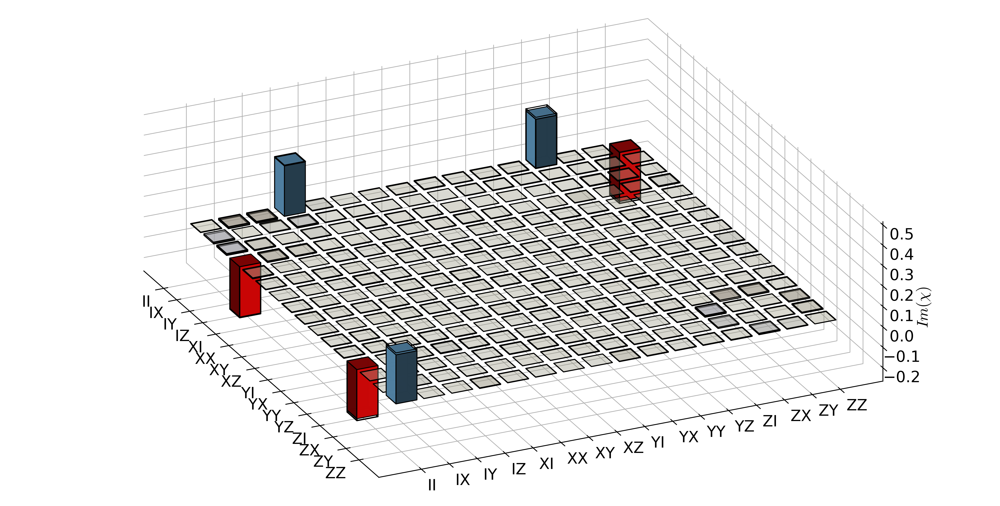

In [53]:
for angle in angles[angle_selection]:
    rho_exp = chis_qtp[angle].full()
    rho_target = UCZ_ideal[angle].full()
    plot_density_matrices(rho_exp, rho_target=rho_target, rho_sim=None, nr_qubits=2,
                          real_part=True, save_fig=save_fig, show=True, 
                          fig_title=f'ch4_characterization_qb3qb2_tomo_{angle*4}_real')
    plot_density_matrices(rho_exp, rho_target=rho_target, rho_sim=None, nr_qubits=2,
                          real_part=False, save_fig=save_fig, show=True, 
                          fig_title=f'ch4_characterization_qb3qb2_tomo_{angle*4}_imag')

In [54]:
def fid_with_thermal_pop(fid, thermal_pops, target_u):
    p_all_cold = np.prod(1-np.array(thermal_pops)) #
#     print(p_all_cold)
#     chi_identity = qtp.to_chi(qtp.gates.identity(4))/16
#     chi_identity.dims = [[[2, 2], [2, 2]], [[2, 2], [2, 2]]]
#     chi_dep = qtp.to_chi(qtp.superop_reps._dep_super(1))
#     chi2_dep = qtp.tensor(chi_dep,chi_dep)
#     chi2_dep.dims = [[[2, 2], [2, 2]], [[2, 2], [2, 2]]]
#     return fid*(1 - (1 - p_all_cold)*(1- qtp.process_fidelity(chi2_dep, target_u)))
#     return fid*(1 - (1 - p_all_cold)*(1- qtp.process_fidelity(chi_identity, target_u)))
    return fid*p_all_cold # most naive 

In [57]:
# prepare plot
angles_exp = np.arange(45, 360, 45)
angles_sim = np.linspace(0, 2*np.pi, 20)

raw_fid = np.array([98.013644,97.700835,97.448186,97.312726,97.507021,97.841784,98.348675]) # first round
# raw_fid = np.array([97.981934,97.556124,97.469172,97.164195,97.550900,97.886179,98.300348]) # second round
decoh_fid = np.array([99.46928129, 98.98809914, 99.46063542, 99.29649714, 99.20674685,
       99.14722083, 99.09542153, 99.05088107, 99.02860883, 99.02120397,
       99.0211871 , 99.02119719, 99.02861424, 99.05092101, 99.08807621,
       99.12527106, 99.17734642, 99.25179983, 99.34121929, 99.46805436])
unitary_ideal_for_angle_sim = [qtp.to_chi(qtp.cphase(a))/16 for a in angles_sim]
decoh_therm_fid = [fid_with_thermal_pop(d_f, [0.004,0.013], u) for d_f, u in zip(decoh_fid, unitary_ideal_for_angle_sim)]


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import QubitCircuit


C:\Users\nathan\Anaconda3\envs\pycqed36\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning:

Importing functions/classes of the qip submodule directly from the namespace qutip is deprecated. Please import them from the submodule instead, e.g.
from qutip.qip.operations import cnot
from qutip.qip.circuit import Q

[Text(0, 0, '$\\pi/4$'),
 Text(0, 0, '$\\pi/2$'),
 Text(0, 0, '$3\\pi/4$'),
 Text(0, 0, '$\\pi$'),
 Text(0, 0, '$5\\pi/4$'),
 Text(0, 0, '$3\\pi/2$'),
 Text(0, 0, '$7\\pi/4$')]

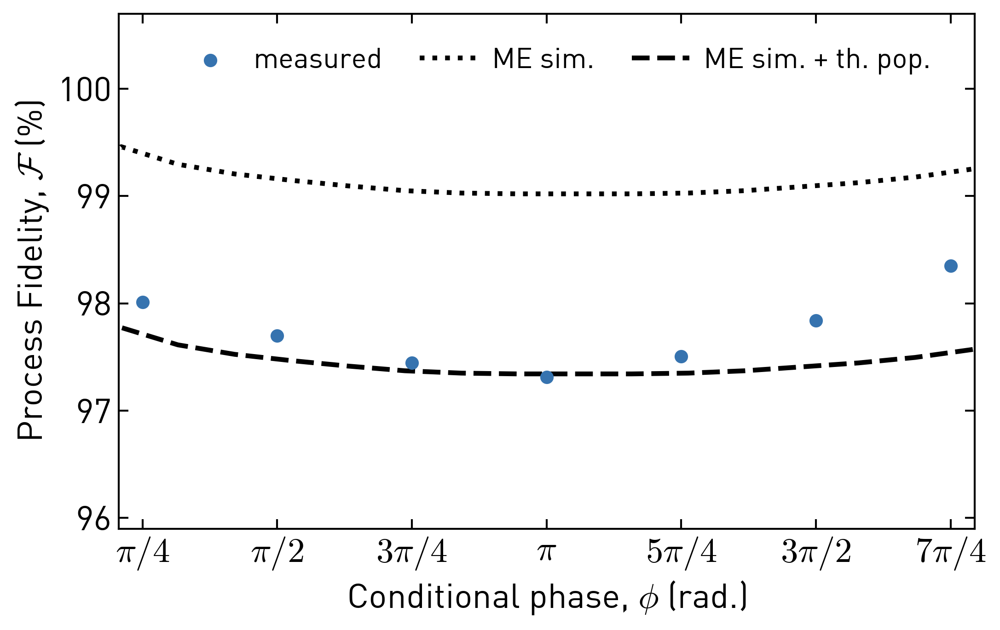

In [92]:
colors = ['#3673AF','#FF6947', "#39B265", "#734687"]

fig, ax = plt.subplots()
ax.plot(angles_sim*180/np.pi, decoh_therm_fid, '--', zorder=-1, label="ME sim. + th. pop.", color="k")

ax.plot(angles_sim*180/np.pi, decoh_fid, ':', color="k", zorder=-1, label='ME sim.')
ax.scatter(angles_exp, raw_fid, color=colors[0], zorder=0, label="measured")

# ax.plot(angles_sim*180/np.pi, decoh_fid, ':', color='k', label='sim.')
# ax.plot(angles_sim*180/np.pi, decoh_therm_fid, '--', zorder=-1, label="sim. + th. pop.", color='k')
# ax.scatter(angles_exp, raw_fid, color=colors[0], edgecolor='k', facecolor='w', zorder=0, label="measured")
handles, labels = ax.get_legend_handles_labels()

ax.legend(handles[::-1], labels[::-1], ncol=3, columnspacing=1.3, fontsize=15, loc=[0.060, 0.8600], handletextpad =0.5)


plt.xticks(angles_exp)
plt.ylim([95.9, 100.7])
plt.xlim([37, 323])
plt.ylabel(r'Process Fidelity, $\mathcal{F}$ (%)' )
plt.xlabel(r'Conditional phase, $\phi$ (rad.)')
ax.set_xticklabels([r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$', r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$'])

In [93]:
fig.savefig(figsave_base + "ch4_characterization_tomo_all_angles_{:%Y%m%d_%H%M%S}.png".format(datetime.datetime.now()),
            transparent=False)

In [108]:
fid = 0.99
p_all_cold = 0.99*0.99
chi_identity = qtp.to_chi(qtp.gates.identity(4))/16
chi_identity.dims = [[[2, 2], [2, 2]], [[2, 2], [2, 2]]]

fid*(1 - (1 - p_all_cold)*(1- qtp.process_fidelity(chi_identity, UCZ_ideal[np.pi/4])**2))

0.9752242499999999